## **Executive Summary**

This project aims to gain a better understanding of the old times captured in grayscale photographs by transforming them into visually compelling colour images. Recognizing that photos from the past were predominantly grayscale, the objective is to enhance their appeal by leveraging a generative adversarial network (GAN) for colorization. Specifically, the GAN is trained on grayscale images featuring human faces. The training process involves supplying the GAN with paired inputs, comprising a grayscale image and its corresponding colour version, with the expectation of obtaining a colourized version. The images undergo preprocessing steps such as resizing and normalization, and they are then divided into training, validation, and testing sets. Two models are implemented in this project. The first model, named *pix2pix*, utilizes a conditional GAN as its generator and a PatchGAN as its discriminator. The second model, called *noPatch*, employs a more conventional discriminator architecture from a deep convolution GAN. By comparing the outputs, *pix2pix* model excels in preserving the detail in the original image while giving a vivid colour palette to the grayscale input. Further work could be done towards implementing a two-step approach, by first detecting the contour of the face and then applying the colorization by segments. 

## **Preprocessing**

#### **Import libraries**

In [26]:
# import the required library functions
import tensorflow as tf
import cv2
import numpy as np
import matplotlib.pyplot as plt

import os
import time
import datetime

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import ReLU, LeakyReLU
from tensorflow.keras.layers import Input, Concatenate, concatenate
from tensorflow.keras.layers import Dropout, BatchNormalization, ZeroPadding2D
from tensorflow.keras.layers import Flatten, Dense, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

#### **Load the dataset**
* The dataset is obtained from Kaggle. (https://www.kaggle.com/datasets/vutuanhai237/gray2colorface) The images are downloaded and stored locally. 
* It consists of 2000 images with the colour and gray images put side by side. It provides *paired inputs*. 
* In this project, 2000 images are used, 80% for training, 10% for validation, and 10% for testing.

In [27]:
# create the path to the folder containing the images
FACE_PATH = 'faces'

In [28]:
# create a list containing the path to each image
face_path = []

for path in os.listdir(FACE_PATH):
    face_path.append(os.path.join(FACE_PATH, path))

# sort the images by name
face_path.sort()

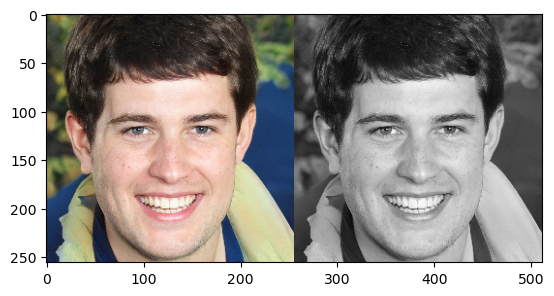

In [29]:
# display the first image
image = cv2.cvtColor(cv2.imread(face_path[100]), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

* The images are 256 x 512 for each pair. It means 256 x 256 for one image. We will work on 128 x 128 for this project.
* We read the images in order using cv2. The images are split, resized, and passed to arrays.
* For cv2, it reads images using BGR. Therefore, we should convert it back to RGB.

In [30]:
NUM_IMAGES = 2000
IMG_SIZE = 128

In [31]:
face_X = []
face_y = []

for i in range(NUM_IMAGES):
    # load the input image and convert it from BGR to RGB
    face_img = cv2.cvtColor(cv2.imread(face_path[i]), cv2.COLOR_BGR2RGB)

    # split the image into the input and output images by half the width
    w = face_img.shape[1] // 2
    face_input_img = face_img[:, w:, :]
    face_real_img = face_img[:, :w, :]

    # resize the images to 128 x 128
    face_input_img = cv2.resize(face_input_img, (IMG_SIZE, IMG_SIZE)).astype('float32')
    face_real_img = cv2.resize(face_real_img, (IMG_SIZE, IMG_SIZE)).astype('float32')

    # append the images to the list
    face_X.append(face_input_img)
    face_y.append(face_real_img)

In [32]:
# convert the list to numpy array
X = np.array(face_X)
y = np.array(face_y)

In [33]:
# check the shape of the arrays
X.shape, y.shape

((2000, 128, 128, 3), (2000, 128, 128, 3))

* Here we should note that for the gray (input) images, although they are in gray, they are an image with 3 channels. 
* This fits our use case. For old original pictures that come in gray tone, if we scan it, we are expected to obtain an image file with 3 channels.

In [34]:
# check the range of the images
X.min(), X.max(), y.min(), y.max()

(0.0, 255.0, 0.0, 255.0)

* We check the images using some sample.

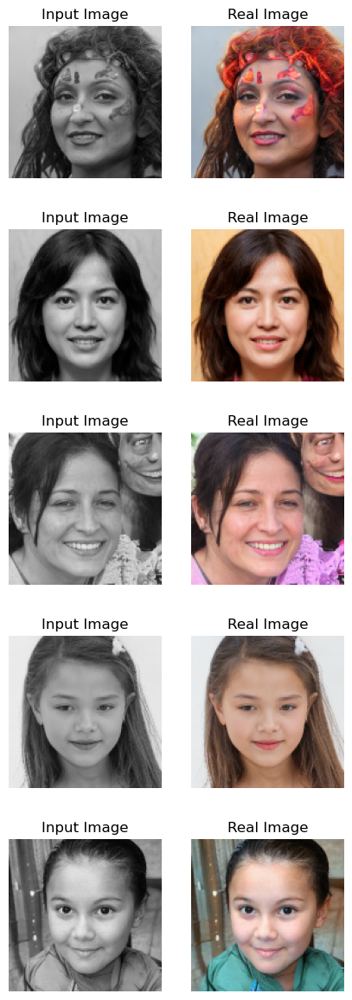

In [35]:
plt.figure(figsize = (5, 30))

i = 0
while i < 10:

    ran_num = np.random.randint(0, NUM_IMAGES)

    plt.subplot(10, 2, i+1)
    plt.imshow(X[ran_num] / 255.)
    plt.title('Input Image')
    plt.axis('off')

    plt.subplot(10, 2, i+2)
    plt.imshow(y[ran_num] / 255.)
    plt.title('Real Image')
    plt.axis('off')

    i += 2

plt.show()

#### **Preprocessing**
* For each array, we normalize the images to [-1, 1].

In [36]:
# normalize the images to the range [-1, 1]
X = (X / 127.5) - 1
y = (y / 127.5) - 1

In [37]:
# check the range of the images
X.min(), X.max(), y.min(), y.max()

(-1.0, 1.0, -1.0, 1.0)

#### **Train Test Split**
* The dataset is split into training, validation, and testing using a split of 80%, 10%, 10%. 

In [38]:
# split the dataset into training, validation and testing sets
X_train, X_test_val, y_train, y_test_val = train_test_split(X, y, train_size=0.8, shuffle=False, random_state=80)

In [39]:
# split the testing set into validation and testing sets
X_val, X_test, y_val, y_test = train_test_split(X_test_val, y_test_val, train_size=0.5, shuffle=False, random_state=80)

In [40]:
# check the shape of the arrays
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((1600, 128, 128, 3),
 (200, 128, 128, 3),
 (200, 128, 128, 3),
 (1600, 128, 128, 3),
 (200, 128, 128, 3),
 (200, 128, 128, 3))

#### **Build the dataset**
* Further set up the dataset in a compatible way to feed into the GAN.
* BATCH_SIZE = 1 is to feed one image at a time for each step.
* BUFFER_SIZE is to shuffle all the available data. 

In [41]:
BATCH_SIZE = 1
BUFFER_SIZE_TRAIN = 1600
BUFFER_SIZE_VAL = 200
BUFFER_SIZE_TEST = 200

In [42]:
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).shuffle(BUFFER_SIZE_TRAIN).batch(BATCH_SIZE)
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).shuffle(BUFFER_SIZE_VAL).batch(BATCH_SIZE)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test)).shuffle(BUFFER_SIZE_TEST).batch(BATCH_SIZE)

## **Models**

### **pix2pix - conditional GAN**
* Upon research, the type of GAN to handle paired inputs is called *conditional generative adversarial network* (cGAN), also called *pix2pix*. https://www.tensorflow.org/tutorials/generative/pix2pix

* It learns a mapping from input images to output images. In the pix2pix cGAN, the corresponding output images are conditioned on input images. 
* In this project, the model will generate colourized images from grayscale human face images. 

* The architecture of the network will contain
1. A generator with a U-Net-based architecture.
2. A discriminator represented by a convolutional PatchGAN classifier.
* The details of each will be discussed later.

#### **The Generator**
* The generator is a modified U-Net. U-Net is a convolutional network architecture for fast and precise segmentation of images, especially in biomedical images. 
* Details of U-Net: https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/

* In a U-Net, the image is converted into a vector and the same mapping is used to convert it back to an image. The purpose of this design is to minimize distortion.

* A U-Net consists of an encoder (downsampler) and a decoder (upsampler).
1. Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
2. Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (optioned) -> ReLU

* There are skip connections between the encoder and decoder (as in the U-Net).

In [68]:
OUTPUT_CHANNELS = 3
init = tf.random_normal_initializer(0., 0.02)

In [69]:
# define the downsample block
def downsample(filters, size, apply_batchnorm=True):
    initializer = init

    result = Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(BatchNormalization())

    result.add(LeakyReLU())

    return result

In [70]:
# test the downsample block
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(X_test[80], 0))
down_result.shape

TensorShape([1, 64, 64, 3])

In [71]:
# define the upsample block
def upsample(filters, size, apply_dropout=False):
    initializer = init

    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

    result.add(BatchNormalization())

    if apply_dropout:
        result.add(Dropout(0.5))

    result.add(ReLU())

    return result

In [72]:
# test the upsample block
up_model = upsample(3, 4)
up_result = up_model(down_result)
up_result.shape

TensorShape([1, 128, 128, 3])

* Input: images of 128, 128, 3
* Output: images of 128, 128, 3

In [116]:
def make_generator_model():
    inputs = Input(shape=[128, 128, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 64, 64, 64)
        downsample(128, 4),  # (batch_size, 32, 32, 128)
        downsample(256, 4),  # (batch_size, 16, 16, 256)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4),  # (batch_size, 8, 8, 1024)
        upsample(256, 4),  # (batch_size, 16, 16, 512)
        upsample(128, 4),  # (batch_size, 32, 32, 256)
        upsample(64, 4),  # (batch_size, 64, 64, 128)
    ]

    initializer = init
    last = Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                          kernel_initializer=initializer, activation='tanh')  # (batch_size, 128, 128, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)

    return Model(inputs=inputs, outputs=x)

* Test the generator with an image.
* Since the generator is not trained, the output is gray with a slight hint of the human face contour. 

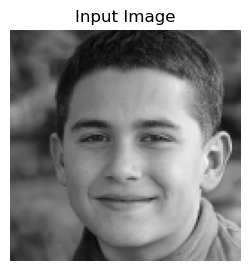

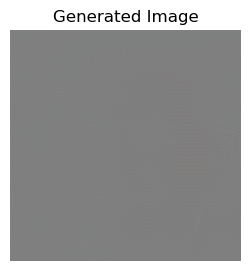

In [117]:
generator_1 = make_generator_model()

# check the generator output
sample_inp = X_train[0]
generated_image = generator_1(sample_inp[tf.newaxis, ...], training=False)

plt.figure(figsize = (3, 3))
plt.imshow(sample_inp * 0.5 + 0.5)
plt.title('Input Image')
plt.axis('off')
plt.show()

plt.figure(figsize = (3, 3))
plt.imshow(generated_image[0, ...] * 0.5 + 0.5)
plt.title('Generated Image')
plt.axis('off')
plt.show()

In [118]:
generator_1.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
sequential_52 (Sequential)      (None, 64, 64, 64)   3072        input_4[0][0]                    
__________________________________________________________________________________________________
sequential_53 (Sequential)      (None, 32, 32, 128)  131584      sequential_52[0][0]              
__________________________________________________________________________________________________
sequential_54 (Sequential)      (None, 16, 16, 256)  525312      sequential_53[0][0]              
____________________________________________________________________________________________

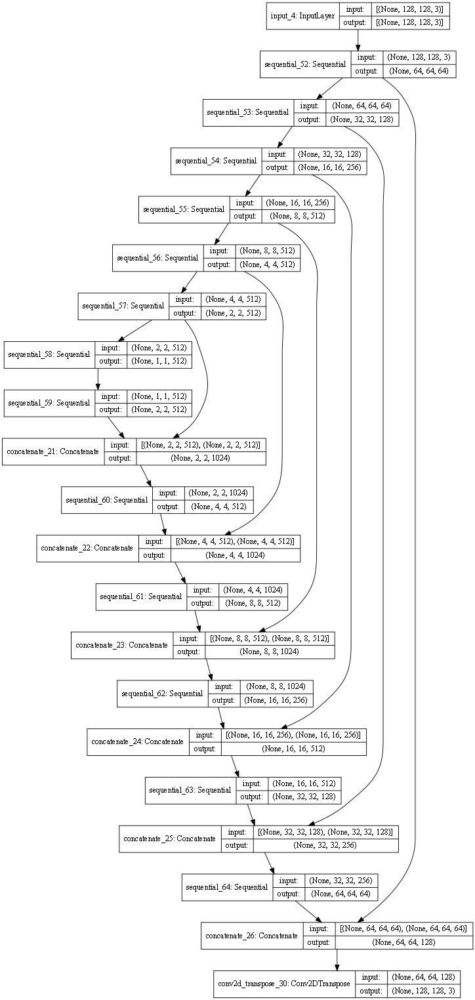

In [119]:
# note the use of concatenate layer
tf.keras.utils.plot_model(generator_1, show_shapes=True, dpi=64)

#### **The Discriminator**
* The discriminator is a convolutional PatchGAN classifier. PatchGAN tries to classify if each image patch is real or not real. 
* Each block in the discriminator is Convolution -> Batch normalization -> Leaky ReLU.
* The shape of the output after the last layer is (30, 30, 1).
* Each 30 x 30 image patch of the output classifies a 20 x 20 portion of the input image.

* The discriminator receives input by concatenating 2 inputs
1. The input image and the target image, should be classified as real.
2. The input image and the generated image (the output of the generator), should classify as fake.

In [120]:
def make_discriminator_model():
    initializer = init

    inp = Input(shape=[128, 128, 3], name='input_image')
    tar = Input(shape=[128, 128, 3], name='target_image')

    x = concatenate([inp, tar])  # (batch_size, 128, 128, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 64, 64, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 32, 32, 128)

    zero_pad1 = ZeroPadding2D()(down2)  # (batch_size, 34, 34, 128)
    conv = Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = BatchNormalization()(conv)

    leaky_relu = LeakyReLU()(batchnorm1)

    zero_pad2 = ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return Model(inputs=[inp, tar], outputs=last)

* Test the discriminator
* We can see the patch denoting the classification.

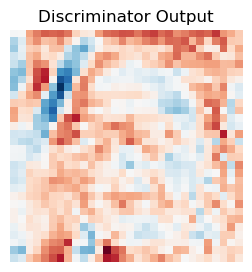

In [121]:
discriminator_1 = make_discriminator_model()

# check the discriminator output
disc_out = discriminator_1([sample_inp[tf.newaxis, ...], generated_image], training=False)

plt.figure(figsize = (3, 4))
plt.imshow(disc_out[0, :, :, 0], cmap='RdBu_r')
plt.title('Discriminator Output')
plt.axis('off')
plt.show()

In [122]:
discriminator_1.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
concatenate_27 (Concatenate)    (None, 128, 128, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_65 (Sequential)      (None, 64, 64, 64)   6144        concatenate_27[0][0]       

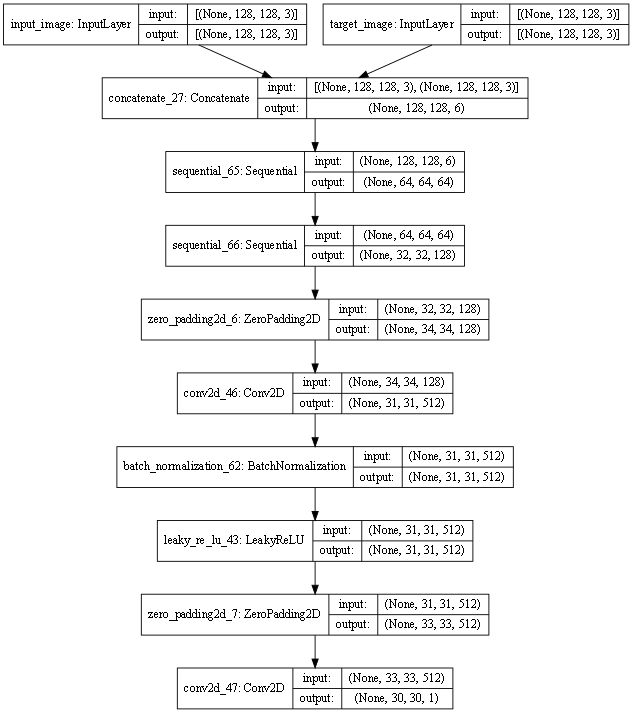

In [123]:
# note the two inputs to the discriminator
tf.keras.utils.plot_model(discriminator_1, show_shapes=True, dpi=64)

#### **Loss and optimizers**

##### Generator loss
cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image.

* The generator loss is a sigmoid cross-entropy loss of the generated images and an array of ones.
* The L1 loss is an MAE (mean absolute error) between the generated image and the target image.
* The total generator loss is calculated as gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. (This value was decided by the authors of the pix2pix paper.)

In [124]:
LAMBDA = 100

In [125]:
loss_object = BinaryCrossentropy(from_logits=True)

In [126]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

##### Discriminator loss
The discriminator_loss function takes 2 inputs: **real images** and **generated images**.
* *real_loss* is a sigmoid cross-entropy loss of the **real images** and an **array of ones** (since these are the **real images**).
* *generated_loss* is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros** (since these are the **fake images**).
* The *total_loss* is the sum of *real_loss* and *generated_loss*.

In [127]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

##### Optimizers
* We use Adam as the optimizer.

In [128]:
generator_optimizer = Adam(2e-4, beta_1=0.5)
discriminator_optimizer = Adam(2e-4, beta_1=0.5)

#### **Helper functions**

##### Checkpoint saver
* Because the training task is long, we use a checkpoint to save and restore models.



In [129]:
checkpoint_dir = './training_checkpoints'

In [130]:
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt1")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                    discriminator_optimizer=discriminator_optimizer,
                                    generator=generator_1,
                                    discriminator=discriminator_1)

##### Display images
* A function to plot some images during training by passing images from the testing set to the generator. 

In [131]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(10, 10))

    display_list = [test_input[0], prediction[0], tar[0]]
    title = ['Input Image', 'Predicted Image', 'Real Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

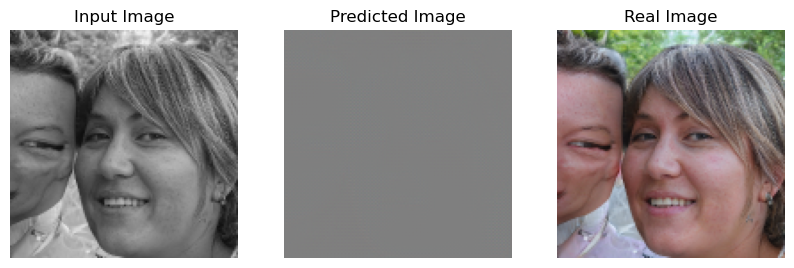

In [132]:
# test the function
for example_input, example_target in val_ds.take(1):
    generate_images(generator_1, example_input, example_target)

#### **Training**
* For each input, the generator generates an output.
* The discriminator receives the **input_image** and the **generated image** as the *first* input. The *second* input is the **input_image** and the **target_image**.
* Calculate the generator and the discriminator loss.
* Calculate the gradients of loss and apply them to the optimizer.
* Log the losses to the array.



In [133]:
# to plot loss later on
gen_total_loss_list = []
gen_gan_loss_list = []
gen_l1_loss_list = []
disc_loss_list = []

In [134]:
# to allow the numpy array to be saved
tf.config.run_functions_eagerly(True)

In [135]:
# the use of 'tf.function' causes the function to be "compiled".
@tf.function
def train_step(generator, discriminator, input_image, target, step, generator_optimizer, discriminator_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        gen_total_loss_list.append(gen_total_loss.numpy())
        gen_gan_loss_list.append(gen_gan_loss.numpy())
        gen_l1_loss_list.append(gen_l1_loss.numpy())
        disc_loss_list.append(disc_loss.numpy())

        if (step) % 1000 == 0:
            if step != 0:
                tf.print('Discriminator loss: ', disc_loss)
                tf.print('Generator GAN loss: ', gen_gan_loss)
                tf.print('Generator L1 loss: ', gen_l1_loss)
                tf.print('Generator total loss: ', gen_total_loss)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

The *fit* function is the actual training loop. 
* It iterates over the number of steps.
* For every 10 steps, it prints a dot (.).
* For every 1k steps, it runs *generate_images* to show the progress.
* For every 10k steps, it saves a checkpoint.



In [136]:
def fit(train_ds, val_ds, steps, generator, discriminator):
    example_input, example_target = next(iter(val_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            # display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(generator, discriminator, input_image, target, step, generator_optimizer, discriminator_optimizer)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)

        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 10000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

We fit 15000 steps on this model.

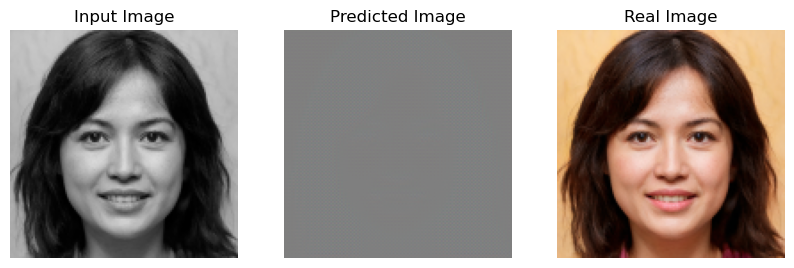

Step: 0k
....................................................................................................Time taken for 1000 steps: 896.72 sec



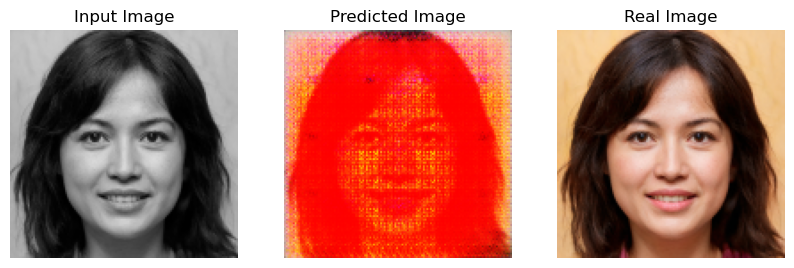

Step: 1k
Discriminator loss:  1.15761018
Generator GAN loss:  0.930127621
Generator L1 loss:  0.100195706
Generator total loss:  10.9496975
....................................................................................................Time taken for 1000 steps: 770.04 sec



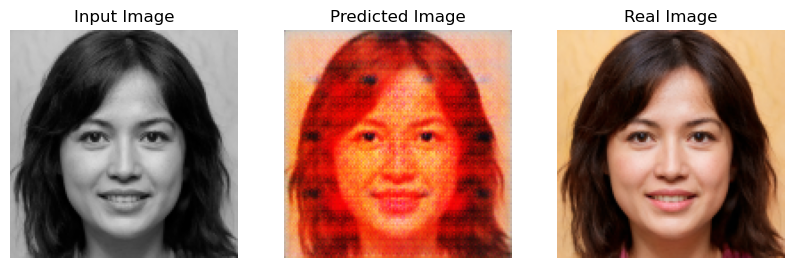

Step: 2k
Discriminator loss:  0.990953088
Generator GAN loss:  0.740072
Generator L1 loss:  0.0882869437
Generator total loss:  9.56876659
....................................................................................................Time taken for 1000 steps: 768.34 sec



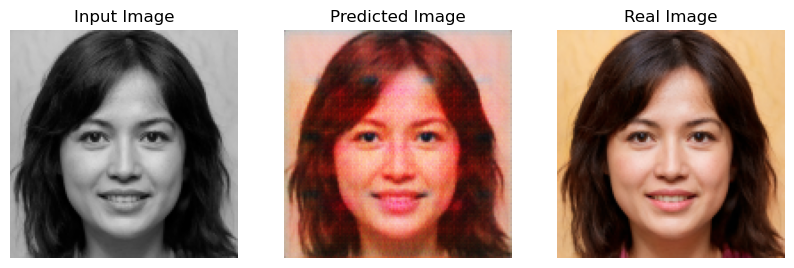

Step: 3k
Discriminator loss:  1.51096237
Generator GAN loss:  0.865080953
Generator L1 loss:  0.0758491084
Generator total loss:  8.44999218
....................................................................................................Time taken for 1000 steps: 822.16 sec



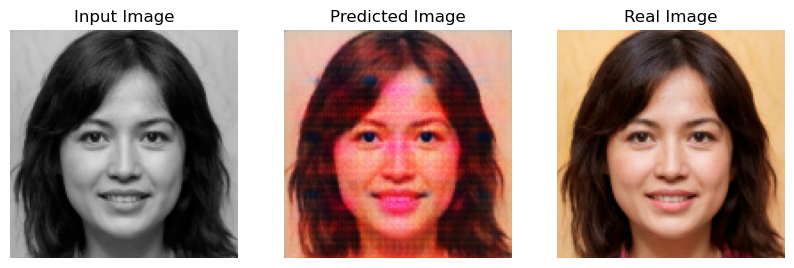

Step: 4k
Discriminator loss:  0.797667921
Generator GAN loss:  1.90576577
Generator L1 loss:  0.0717510283
Generator total loss:  9.08086872
....................................................................................................Time taken for 1000 steps: 813.81 sec



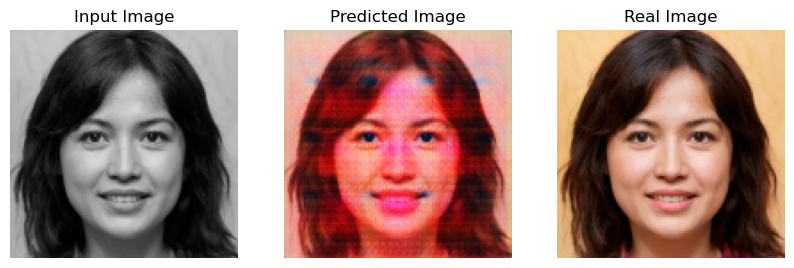

Step: 5k
Discriminator loss:  1.06223
Generator GAN loss:  0.797512293
Generator L1 loss:  0.0677491203
Generator total loss:  7.57242393
....................................................................................................Time taken for 1000 steps: 837.41 sec



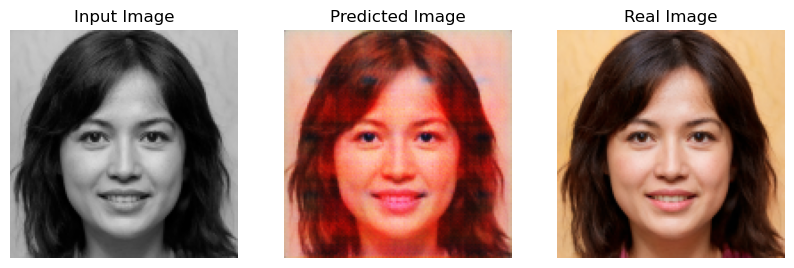

Step: 6k
Discriminator loss:  1.36869931
Generator GAN loss:  0.713318527
Generator L1 loss:  0.045627784
Generator total loss:  5.27609682
....................................................................................................Time taken for 1000 steps: 844.70 sec



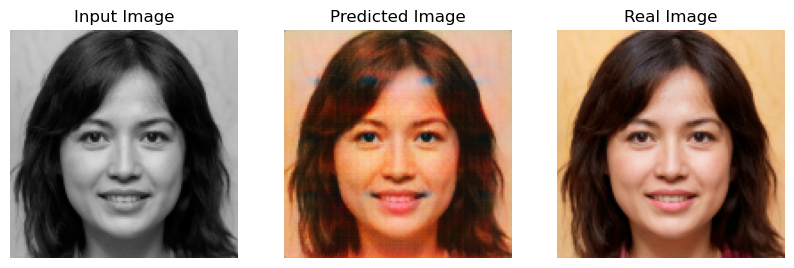

Step: 7k
Discriminator loss:  1.9235642
Generator GAN loss:  0.527978897
Generator L1 loss:  0.0507117026
Generator total loss:  5.59914923
....................................................................................................Time taken for 1000 steps: 815.80 sec



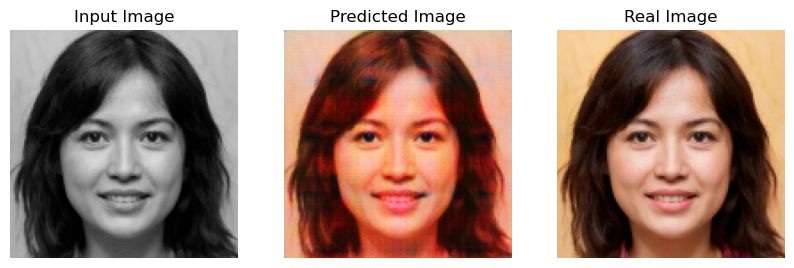

Step: 8k
Discriminator loss:  0.0131787816
Generator GAN loss:  5.0663662
Generator L1 loss:  0.0736927167
Generator total loss:  12.4356384
....................................................................................................Time taken for 1000 steps: 885.79 sec



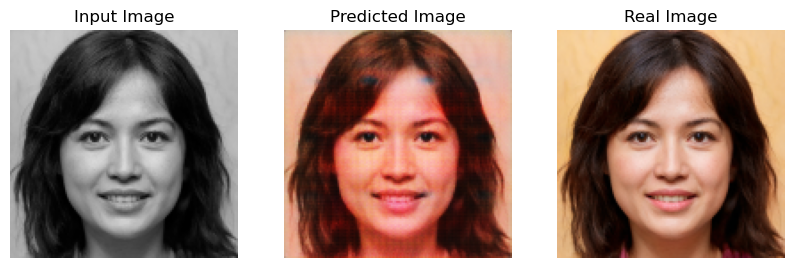

Step: 9k
Discriminator loss:  2.12747288
Generator GAN loss:  0.333717823
Generator L1 loss:  0.0544269122
Generator total loss:  5.77640915
....................................................................................................Time taken for 1000 steps: 863.52 sec



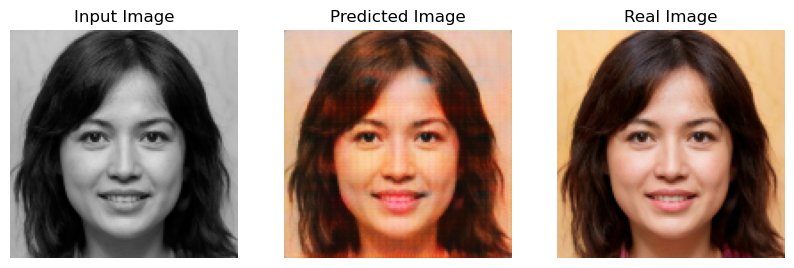

Step: 10k
Discriminator loss:  0.0387582257
Generator GAN loss:  3.66952372
Generator L1 loss:  0.0553856231
Generator total loss:  9.20808601
....................................................................................................Time taken for 1000 steps: 886.11 sec



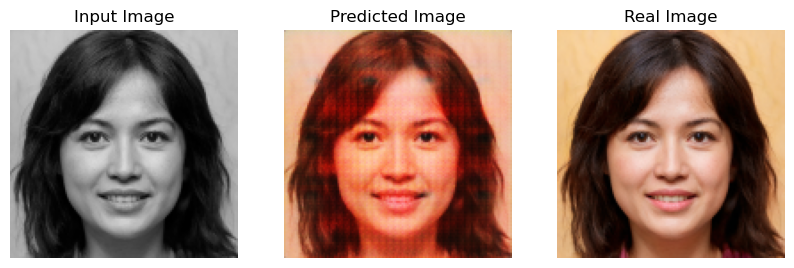

Step: 11k
Discriminator loss:  1.25754046
Generator GAN loss:  0.763612211
Generator L1 loss:  0.0696933493
Generator total loss:  7.73294735
....................................................................................................Time taken for 1000 steps: 914.08 sec



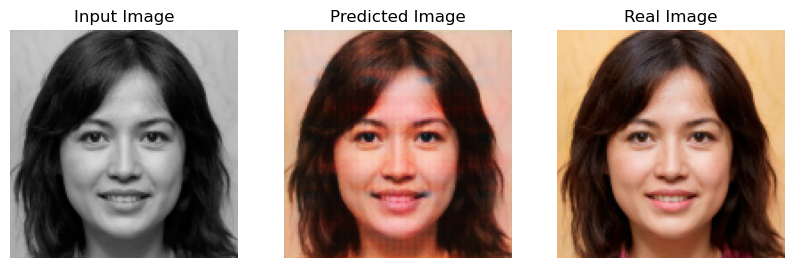

Step: 12k
Discriminator loss:  0.456186205
Generator GAN loss:  1.26861024
Generator L1 loss:  0.137902841
Generator total loss:  15.0588942
....................................................................................................Time taken for 1000 steps: 866.40 sec



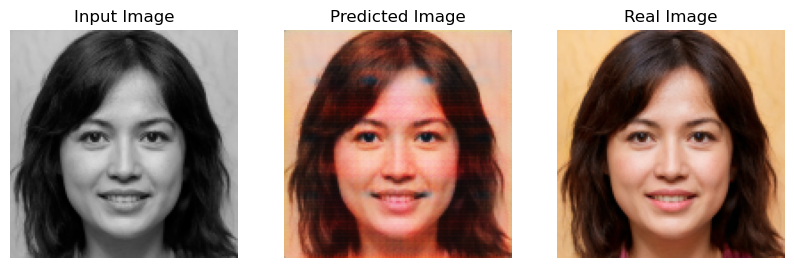

Step: 13k
Discriminator loss:  3.73940897
Generator GAN loss:  3.65569162
Generator L1 loss:  0.0804455057
Generator total loss:  11.700243
....................................................................................................Time taken for 1000 steps: 907.96 sec



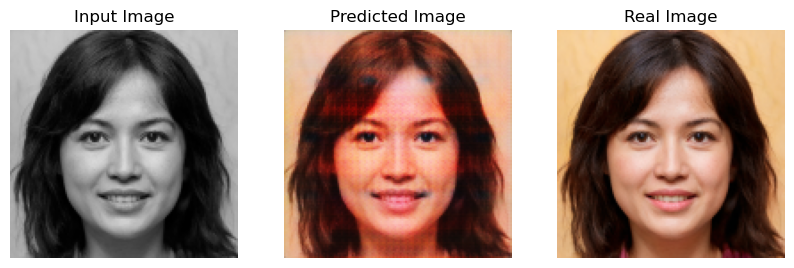

Step: 14k
Discriminator loss:  1.299914
Generator GAN loss:  0.956946909
Generator L1 loss:  0.0457349233
Generator total loss:  5.53043938
....................................................................................................

In [137]:
fit(train_ds, val_ds, 15000, generator_1, discriminator_1)

### **a GAN without Patch (noPatch) output**
We are going to model one more GAN with a simpler generator and a discriminator that outputs only one value. 
* The architecture idea is inspired by https://medium.com/@finnmabie19/colorizing-images-using-a-gan-b7b2a5fbd790

#### **The Generator**
* We tweaked the input and output to fit our datasets.

* The generator consists of 3 parts. 
1. downsampler with Conv2D -> LeakyReLU
2. bottleneck is a Conv2D with activation tanh
3. upsampler with Concatenate and Conv2DTranspose with activation relu
* Input: images of 128, 128, 3
* Output: images of 128, 128, 3

In [140]:
def make_generator_model_2():
    inputs = Input(shape=(128, 128, 3))
    
    conv1 = Conv2D(filters=16, kernel_size=5, strides=1)(inputs) # 124 x 124 x 16
    conv1 = LeakyReLU()(conv1)
    conv1 = Conv2D(filters=32, kernel_size=3, strides=1)(conv1) # 122 x 122 x 32
    conv1 = LeakyReLU()(conv1)
    conv1 = Conv2D(filters=32, kernel_size=3, strides=1)(conv1) # 120 x 120 x 32
    conv1 = LeakyReLU()(conv1)

    conv2 = Conv2D(filters=32, kernel_size=5, strides=1)(conv1) # 116 x 116 x 32
    conv2 = LeakyReLU()(conv2)
    conv2 = Conv2D(filters=64, kernel_size=3, strides=1)(conv2) # 114 x 114 x 64
    conv2 = LeakyReLU()(conv2)
    conv2 = Conv2D(filters=64 , kernel_size=3, strides=1)(conv2) # 112 x 112 x 64
    conv2 = LeakyReLU()(conv2)

    conv3 = Conv2D(filters=64 , kernel_size=5, strides=1)(conv2) # 108 x 108 x 64
    conv3 = LeakyReLU()(conv3)
    conv3 = Conv2D(filters=128 , kernel_size=3, strides=1)(conv3) # 106 x 106 x 128
    conv3 = LeakyReLU()(conv3)
    conv3 = Conv2D(filters=128 , kernel_size=3, strides=1)(conv3) # 104 x 104 x 128
    conv3 = LeakyReLU()(conv3)

    bottleneck = Conv2D(filters=128, kernel_size=3, strides=1, activation='tanh', padding='same')(conv3) # 104 x 104 x 128

    concat_1 = Concatenate()([bottleneck, conv3]) # 104 x 104 x 256
    conv_up_3 = Conv2DTranspose(filters=128, kernel_size=3, strides=1, activation='relu')(concat_1) # 106 x 106 x 128
    conv_up_3 = Conv2DTranspose(filters=128, kernel_size=3, strides=1, activation='relu')(conv_up_3) # 108 x 108 x 128 
    conv_up_3 = Conv2DTranspose(filters=64, kernel_size=5, strides=1, activation='relu')(conv_up_3) # 112 x 112 x 64

    concat_2 = Concatenate()([conv_up_3, conv2]) # 112 x 112 x 128
    conv_up_2 = Conv2DTranspose(filters=64, kernel_size=3, strides=1, activation='relu')(concat_2) # 114 x 114 x 64
    conv_up_2 = Conv2DTranspose(filters=64, kernel_size=3, strides=1, activation='relu')(conv_up_2) # 116 x 116 x 64
    conv_up_2 = Conv2DTranspose(filters=32, kernel_size=5, strides=1, activation='relu')(conv_up_2) # 120 x 120 x 32

    concat_3 = Concatenate()([conv_up_2, conv1]) # 120 x 120 x 64
    conv_up_1 = Conv2DTranspose(filters=32, kernel_size=3, strides=1, activation='relu')(concat_3) # 122 x 122 x 32
    conv_up_1 = Conv2DTranspose(filters=32, kernel_size=3, strides=1, activation='relu')(conv_up_1) # 124 x 124 x 32
    conv_up_1 = Conv2DTranspose(filters=3, kernel_size=5, strides=1, activation='sigmoid')(conv_up_1) # 128 x 128 x 3
    model = Model(inputs, conv_up_1)
    
    return model

* Test the generator.

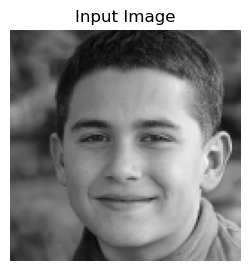

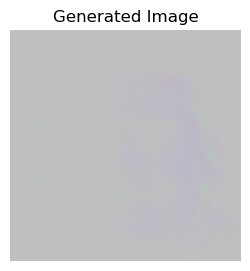

In [141]:
generator_2 = make_generator_model_2()

# check the generator output
sample_inp = X_train[0]
generated_image = generator_2(sample_inp[tf.newaxis, ...], training=False)

plt.figure(figsize = (3, 3))
plt.imshow(sample_inp * 0.5 + 0.5)
plt.title('Input Image')
plt.axis('off')
plt.show()

plt.figure(figsize = (3, 3))
plt.imshow(generated_image[0, ...] * 0.5 + 0.5)
plt.title('Generated Image')
plt.axis('off')
plt.show()

In [142]:
generator_2.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_48 (Conv2D)              (None, 124, 124, 16) 1216        input_5[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_44 (LeakyReLU)      (None, 124, 124, 16) 0           conv2d_48[0][0]                  
__________________________________________________________________________________________________
conv2d_49 (Conv2D)              (None, 122, 122, 32) 4640        leaky_re_lu_44[0][0]             
____________________________________________________________________________________________

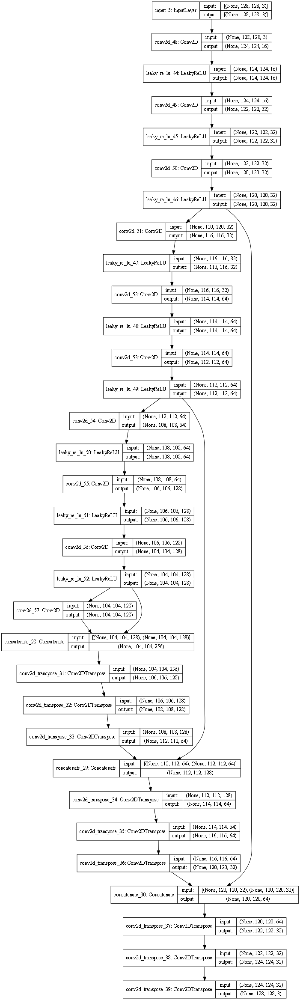

In [143]:
tf.keras.utils.plot_model(generator_2, show_shapes=True, dpi=64)

#### **The Discriminator**
The discriminator model used is adapted from: https://www.tensorflow.org/tutorials/generative/dcgan
* We tweaked the input and output to fit our datasets.

* The Discriminator consists of 
1. 4 blocks of Conv2D -> BatchNormalization (optioned) -> LeakyReLU -> Dropout
2. Flatten -> Dense -> Activation sigmoid
* Input: images of 128, 128, 3
* Output: A number (positive values for real colourized images; negative values for fake colourized images.)



In [144]:
def make_discriminator_model_2():
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=3, padding='same', strides=2, input_shape=(128, 128, 3))) # 64 x 64 x 32
    model.add(LeakyReLU(0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(filters=64, kernel_size=3, padding='same', strides=2)) # 32 x 32 x 64
    model.add(BatchNormalization())
    model.add(LeakyReLU(.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(filters=128, kernel_size=3, padding='same', strides=2)) # 16 x 16 x 128
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(filters=256, kernel_size=3, padding='same', strides=2)) # 8 x 8 x 256
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.2))
    model.add(Dropout(0.25))

    model.add(Flatten()) # 8 x 8 x 256 = 16384
    model.add(Dense(1)) # 1
    model.add(Activation('sigmoid'))

    image = Input(shape=(128, 128, 3))
    validity = model(image)
    
    return Model(image, validity)

* Test the discriminator.
* The output is a single number.

In [145]:
discriminator_2 = make_discriminator_model_2()

# check the discriminator output
disc_out = discriminator_2(generated_image, training=False)

disc_out

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.49864826]], dtype=float32)>

In [146]:
discriminator_2.summary()

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_67 (Sequential)   (None, 1)                 406593    
Total params: 406,593
Trainable params: 405,697
Non-trainable params: 896
_________________________________________________________________


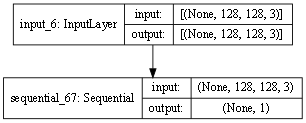

In [147]:
tf.keras.utils.plot_model(discriminator_2, show_shapes=True, dpi=64)

#### **Loss and optimizers**

##### Generator loss
* The generator loss is an MAE (mean absolute error) between the generated image and the target image.

In [149]:
# generator loss
mse = tf.keras.losses.MeanSquaredError()

def generator_loss_2(fake_output, real_y):
    real_y = tf.cast(real_y, 'float32')
    
    return mse(fake_output, real_y)

##### Discriminator loss
The discriminator_loss function takes 2 inputs: **real images** and **generated images**.
* *real_loss* is a sigmoid cross-entropy loss of the **real images** and an **array of ones** (since these are the **real images**).
* *fake_loss* is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros** (since these are the **fake images**).
* The *total_loss* is the sum of *real_loss* and *fake_loss*.

In [148]:
# a helper function to compute cross entropy loss
cross_entropy_2 = BinaryCrossentropy()

In [150]:
# discriminator loss function
def discriminator_loss_2(real_output, fake_output):
    real_loss = cross_entropy_2(tf.ones_like(real_output) - tf.random.uniform(shape=real_output.shape, maxval=0.1), real_output)
    fake_loss = cross_entropy_2(tf.zeros_like(fake_output) + tf.random.uniform(shape=fake_output.shape, maxval=0.1), fake_output)
    total_loss = real_loss + fake_loss
    
    return total_loss

##### Optimizers
* We use Adam as the optimizer.

In [151]:
# use Adam as the optimizer
generator_optimizer_2 = Adam(0.0001)
discriminator_optimizer_2 = Adam(0.0001)

#### **Helper functions**

##### Checkpoint saver
* Becaues the training task is long, we use a checkpoint to save and restore models.

In [152]:
checkpoint_dir_2 = './training_2_checkpoints'

In [153]:
checkpoint_prefix_2 = os.path.join(checkpoint_dir_2, "ckpt")
checkpoint_2 = tf.train.Checkpoint(generator_optimizer=generator_optimizer_2,
                                 discriminator_optimizer=discriminator_optimizer_2,
                                 generator=generator_2,
                                 discriminator=discriminator_2)

#### **Training**
* For each input, the generator generates an output.
* The discriminator receives the **generated image** as the *first* input. The *second* input is the **target_image**.
* Calculate the generator and the discriminator loss.
* Calculate the gradients of loss and apply them to the optimizer.
* Log the losses to the array.



In [154]:
# to plot loss later on
gen_loss_list_2 = []
disc_loss_list_2 = []

In [155]:
# the use of 'tf.function' causes the function to be "compiled".
@tf.function
def train_step_2(generator, discriminator, input_image, target, step, generator_optimizer, discriminator_optimizer):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator(target, training=True)
        disc_generated_output = discriminator(gen_output, training=True)

        gen_loss = generator_loss_2(gen_output, target)
        disc_loss = discriminator_loss_2(disc_real_output, disc_generated_output)

        gen_loss_list_2.append(gen_loss.numpy())
        disc_loss_list_2.append(disc_loss.numpy())

        if (step) % 1000 == 0:
            if step != 0:
                tf.print('Discriminator loss: ', disc_loss)
                tf.print('Generator loss: ', gen_loss)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

The *fit* function is the actual training loop. 
* It iterates over the number of steps.
* For every 10 steps, it prints a dot (.).
* For every 1k steps, it runs *generate_images* to show the progress.
* For every 10k steps, it saves a checkpoint.


In [156]:
def fit_2(train_ds, val_ds, steps, generator, discriminator):
    example_input, example_target = next(iter(val_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            # display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step_2(generator, discriminator, input_image, target, step, generator_optimizer_2, discriminator_optimizer_2)

        # training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)

        # save (checkpoint) the model every 5k steps
        if (step + 1) % 10000 == 0:
            checkpoint_2.save(file_prefix=checkpoint_prefix_2)

We fit 5000 steps on this model.

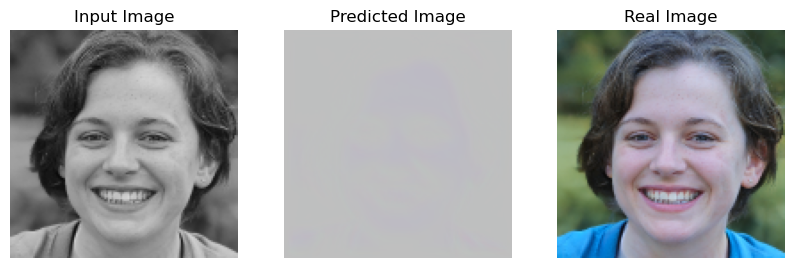

Step: 0k
....................................................................................................Time taken for 1000 steps: 2536.72 sec



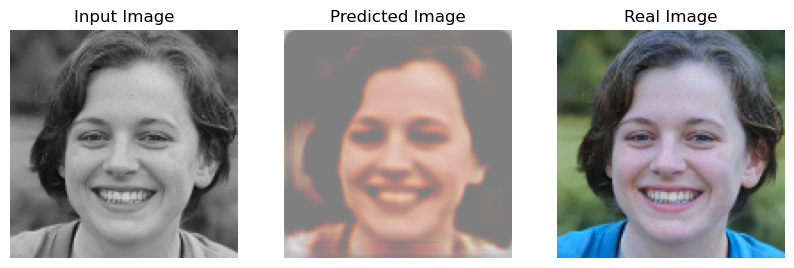

Step: 1k
Discriminator loss:  0.32480067
Generator loss:  0.160347745
....................................................................................................Time taken for 1000 steps: 2369.01 sec



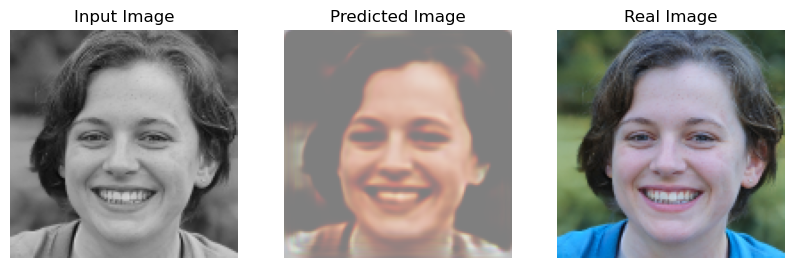

Step: 2k
Discriminator loss:  0.684834778
Generator loss:  0.0524671599
....................................................................................................Time taken for 1000 steps: 2369.78 sec



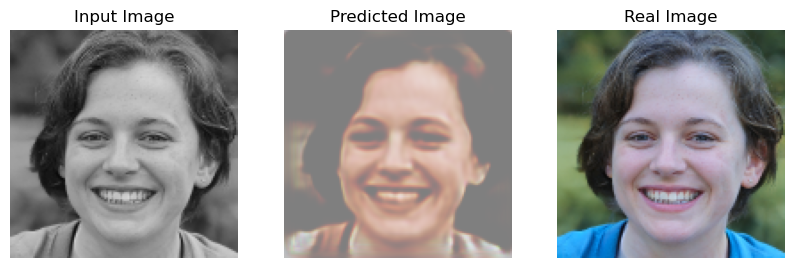

Step: 3k
Discriminator loss:  0.445999414
Generator loss:  0.0525377
....................................................................................................Time taken for 1000 steps: 2598.36 sec



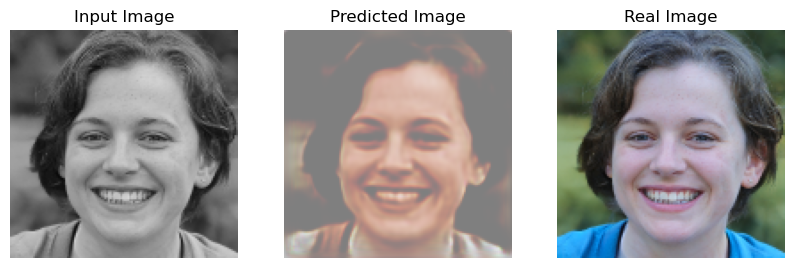

Step: 4k
Discriminator loss:  0.255058229
Generator loss:  0.163822651
....................................................................................................

In [157]:
fit_2(train_ds, val_ds, 5000, generator_2, discriminator_2)

## **Discussion**

The purpose of this project is to use a generative adversarial network (GAN) to colourize grayscale images. After some research, the most popular type of GAN to handle this type of problem is called *conditional generative adversarial network* (cGAN), or *pix2pix*. The main characteristic is that the output is conditioned on the input. The input is not random noise, but an input with a purpose. In our case, the input is a grayscale image, and the output is a colourized version of that grayscale image. Another feature of *pix2pix* is that it uses a convolutional PatchGAN classifier as the discriminator. The inputs to the discriminator are in pairs. 

After exploring the pix2pix model architecture, to understand other alternatives, an extensive search is performed to find an example architecture that uses neither a curated U-Net-based architecture generator nor a PatchGAN as the discriminator. It is found that we may use the more classical discriminator architecture of a deep convolution GAN (dcGAN). The discriminator of a dcGAN may output only a single value. It is believed that it would be more intuitive to understand the training results.

We will discuss the two models separately below.



### **pix2pix - conditional GAN**

To handle a paired input, a GAN called conditional generative adversarial network (cGAN) is used. It is also called pix2pix. It learns a mapping from the input image and then uses it to output the image. The output image is conditioned on the input image.
The architecture of the cGAN contains a generator with a U-Net-based architecture and a discriminator of convolutional PatchGAN classifier. The output of the discriminator is also an image, which visualizes how different the generated image is from the real image by considering the image in many 30x30 patches.
 
Let's check the plots of loss first.



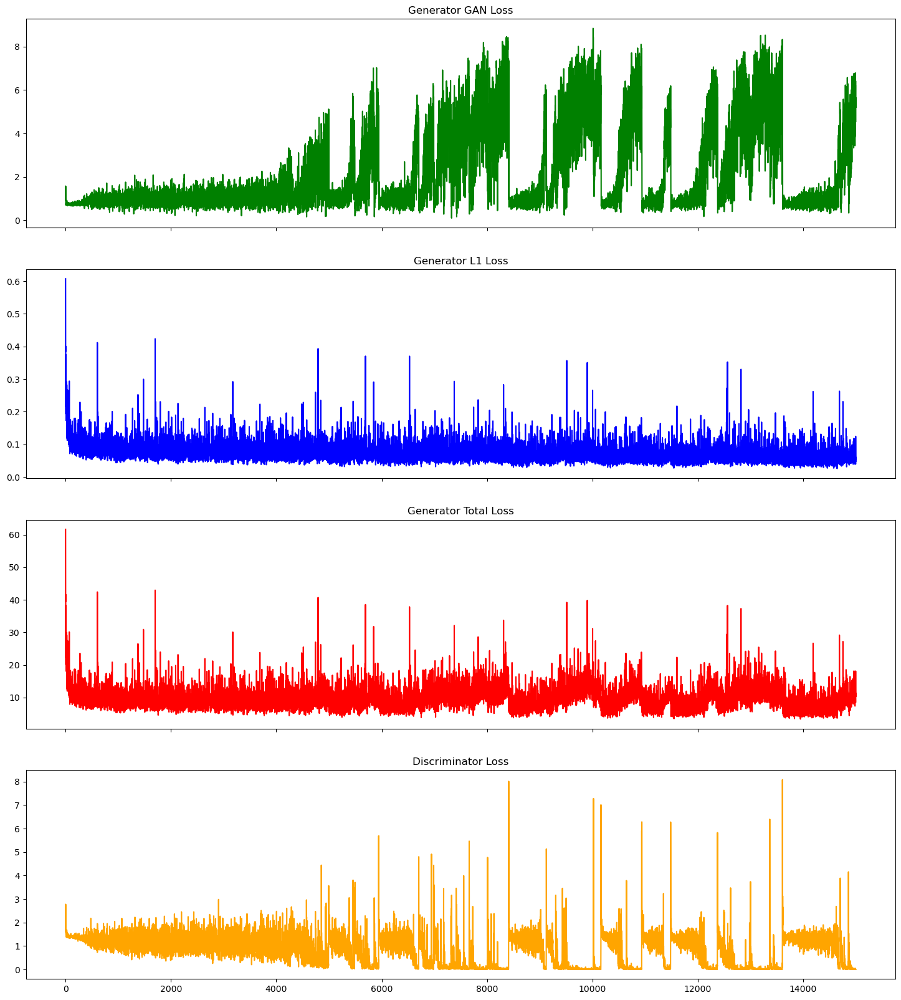

In [185]:
# plot the loss separately
fig, ax = plt.subplots(4, 1, figsize=(18, 20), sharex=True)

ax[0].plot(gen_gan_loss_list, color='green')
ax[0].set_title('Generator GAN Loss')

ax[1].plot(gen_l1_loss_list, color='blue')
ax[1].set_title('Generator L1 Loss')

ax[2].plot(gen_total_loss_list, color='red')
ax[2].set_title('Generator Total Loss')

ax[3].plot(disc_loss_list, color='orange')
ax[3].set_title('Discriminator Loss')

plt.show()


**Discussion**
1. Generator GAN Loss is the Binary Cross Entropy between 1's and the generated output. We should expect this loss to be approaching 0. 
* From the plot of Generator GAN Loss, it varies between 0.1 to 8. At the first 4000 steps, its highest value is around 2. After that, the loss fluctuates a lot. There is a period of smaller value, such as around 9k steps, and then it will build up again to around 8. We can see a hint of a horizontal band across the steps that the Generator GAN Loss should be around 0.8 to 1. 

2. Generator L1 Loss is the mean absolute error between the target image and the generated image. We should expect to see it diminishing to 0. 
* From the plot, it has values that fluctuate about 0.1.

3. Generator Total Loss is a combined value of Generator GAN Loss and Generator L1 Loss. A constant value LAMBDA=100 is used to scale Generator L1 Loss up. This operation significantly increases the effect from Generator L1 Loss to Generator Total Loss. We should expect the Generator Total Loss to be as low as possible.
* Generator Total Loss has a value that fluctuates about 12. 

4. Discriminator Loss is the sum of the loss between the discriminator output of the real image and 1's and the loss between the discriminator output of the generated image and 0's. The discriminator output is on a Patch basis. We should expect the value to be as low as possible.
* For the Discriminator Loss, it varies between 0.5 to 3 for the first 4k steps. After that, fluctuation comes in and we can see some spikes to hit 8. At the same time, we can see the spikes are more separated after 10k steps. There is also a hint of a horizontal band across the steps that the Discriminator Loss should be around 1.5 to 1.8.

5. From these plots, the model was good enough to stop around 10k steps, where the Generator GAN Loss and the Discriminator Loss are both at a low level.



Then we proceed to check the images from the validation visually for the impression.

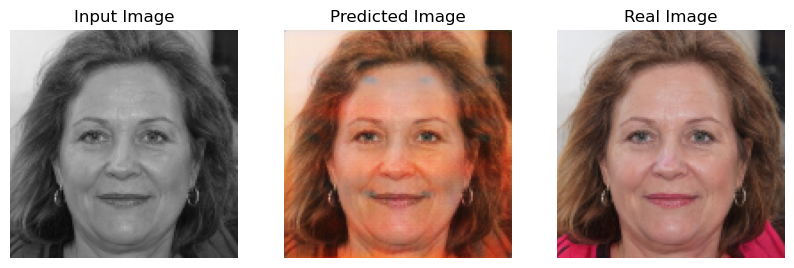

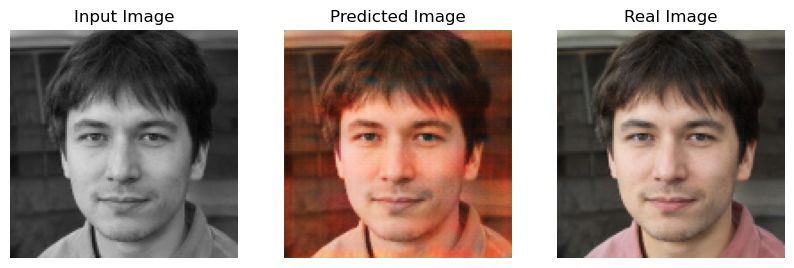

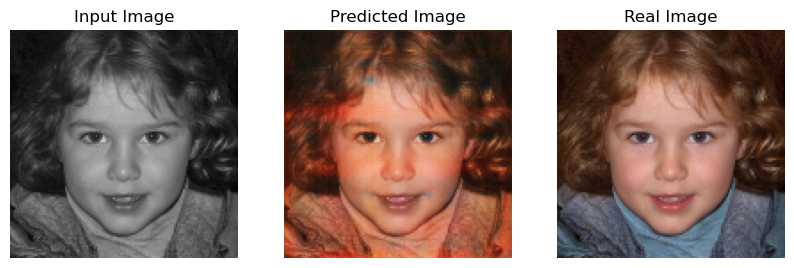

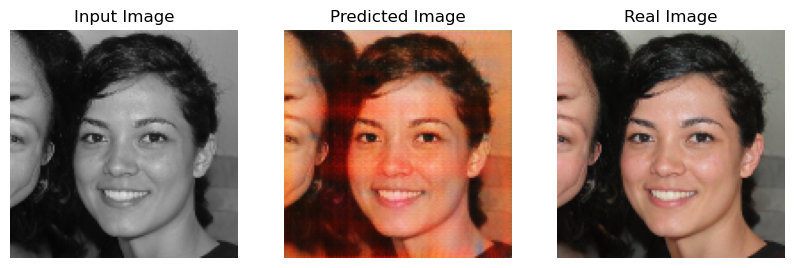

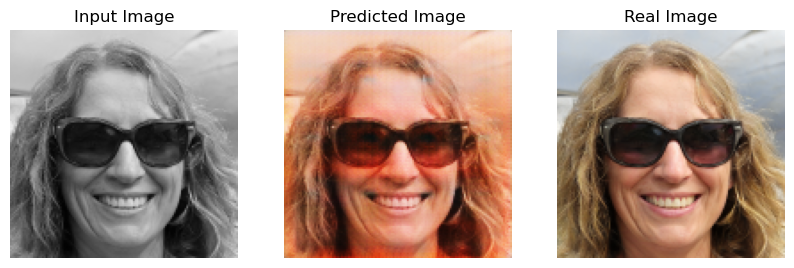

In [139]:
# Run the trained model on a few examples from the validation set
for inp, tar in val_ds.take(5):
    generate_images(generator_1, inp, tar)

**Discussion**
* The predicted images looked livelier than the grayscale inputs. However, if we compared them to the real images, the colour predicted by the model is not like the colours in the real images. 
* The model seems to be applying an uneven shade of orangish pink colour in general to the image. For the skin that is of a darker tone, the model can reveal as well. 
* The areas of brighter colour are close to the forehead and the cheekbone.
* The eye colours generated are dark and the hair colours are in general a shade of chestnut blonde. 
* If we go and check the images produced during the training process, the model first splashed with red and then kept on adjusting the hue of red with yellow. 
* After training with 15k steps, there are some blue shade squares on the generated output, which is not a desired output when we see it visually. Those blue patches are close to the eyes, the corner of the hairline and the lip corners.



### **a GAN without Patch (noPatch) output**

Another GAN architecture is used to understand the impact of the difference in the generator and discriminator architecture. In this model, the generator consists of a downsampler, a bottleneck and an upsampler. It also uses the Concatenate layer. Both the input and output are 128 x 128 x 3. The discriminator is a more classic deep convolution GAN (dcGAN) discriminator that produces one single value as the output. The input is 128 x 128 x3 and the output is a single value.

We look at the loss plots first.



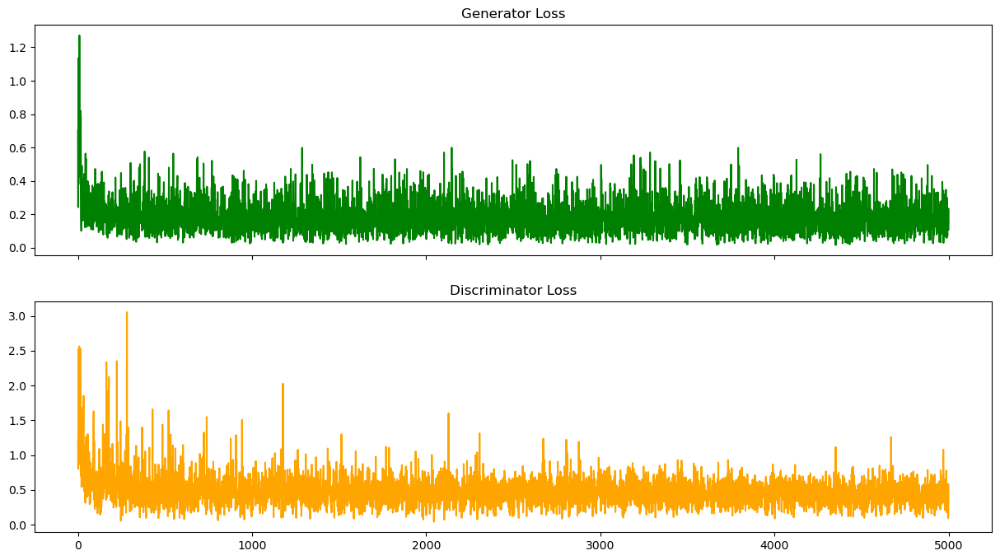

In [191]:
# plot the loss separately
fig, ax = plt.subplots(2, 1, figsize=(15, 8), sharex=True)

ax[0].plot(gen_loss_list_2, color='green')
ax[0].set_title('Generator Loss')

ax[1].plot(disc_loss_list_2, color='orange')
ax[1].set_title('Discriminator Loss')

plt.show()

**Discussion**
* From the plot of Generator Loss, we can see the values fluctuate around 0.2, with some spikes reaching 0.6. 
* The generator loss is the mean absolute error between the generated image and the target image. We should expect to see it decreasing over time, but we do not see this trend in the plot.
* From the plot of Discriminator Loss, we can see the values fluctuate around 0.5, which represents that the discriminator is trained and performed well.
* We should expect to see the fluctuations should be diminishing if the GAN is kept on being trained. However, we do not see this tendency from the plot.



Now we should check the images predicted from the validation set. 



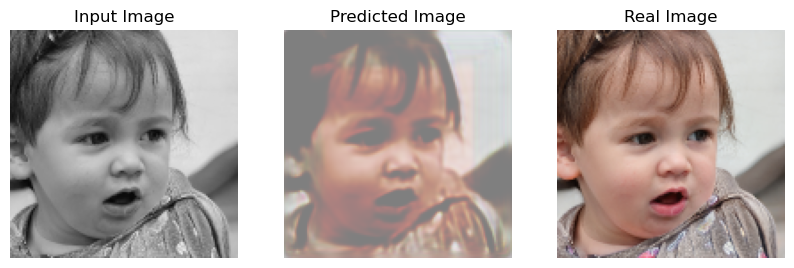

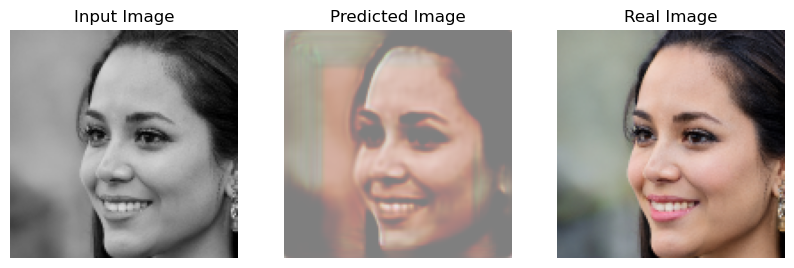

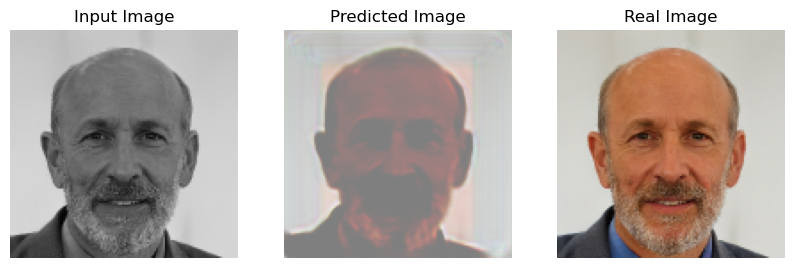

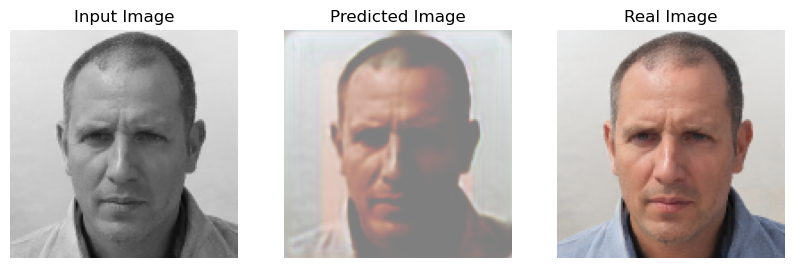

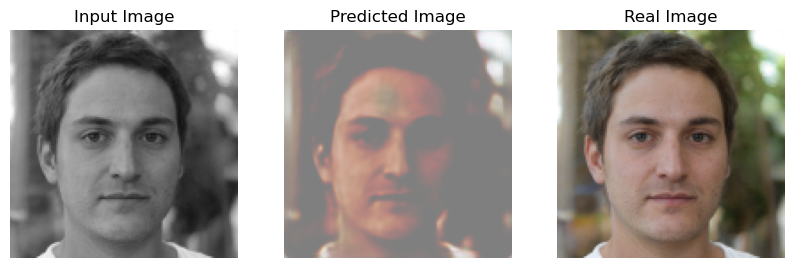

In [160]:
# Run the trained model on a few examples from the validation set
for inp, tar in val_ds.take(5):
    generate_images(generator_2, inp, tar)

**Discussion**
* The images produced are in obviously lower resolution. It comes with the look and feel of some old colour photos from the 1980s.
* We can see a clear orange rectangle in the middle of the generated image. 
* The generated images lost many details, such as the eyes, and facial details in the shade. 
* The colorization is even worse when the human face in the input image is not captured from the front. 



We can compare the images side by side. 

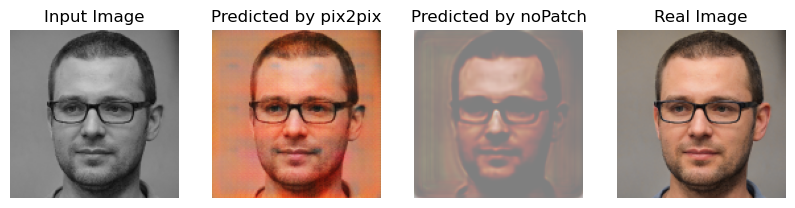

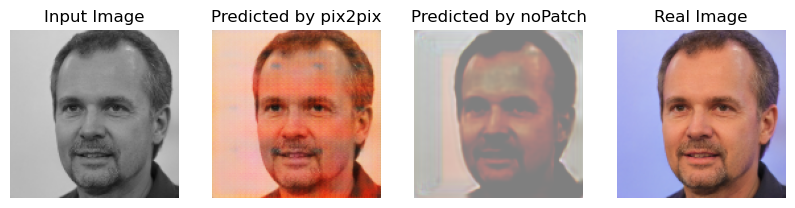

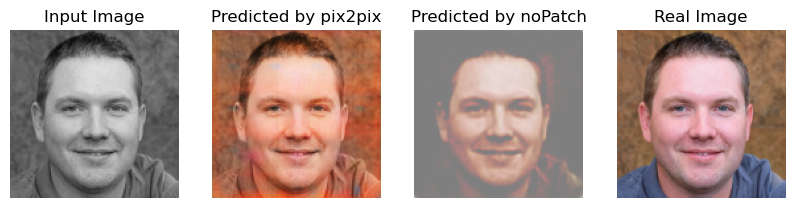

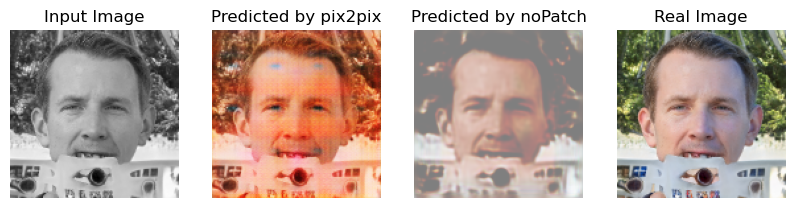

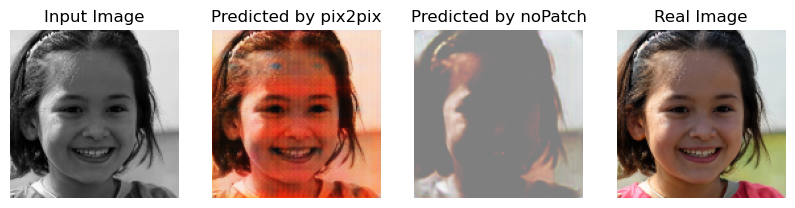

In [162]:
# Run the trained models on a few examples from the validation set
for inp, tar in val_ds.take(5):
    # get the prediction from the models
    prediction_1 = generator_1(inp, training=False)
    prediction_2 = generator_2(inp, training=False)

    plt.figure(figsize=(10, 10))

    display_list = [inp[0], prediction_1[0], prediction_2[0], tar[0]]
    title = ['Input Image', 'Predicted by pix2pix', 'Predicted by noPatch', 'Real Image']

    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

**Discussion**
* From these images, we can see both the strengths and weaknesses of the two models.
* The images from pix2pix are clearer with a vivid tone. It shows the face in detail even the different parts of the eyes. The colourization works well no matter if the human face can be facing front or to the side. The model works well for shaded areas as well. However, the colours applied are uneven. We can observe some blue square patches and a clear orange horizontal band. 
* The images from noPatch are blurred and many details are lost. The face under shade is difficult to recognize. A clear orange square is obvious if the human is facing to the side and the photo becomes unnatural. However, the colour applied is even and makes the photo look real and not generated by a computer. 
* There is one more concern we should take note of. The training time for 15k steps of pix2pix is 213 minutes; that of noPatch for 5k steps is 203 minutes. In terms of time spent vs the generated images, the pix2pix model is more efficient.

## Conclusion

After assessing the image visually, considering the loss and the training time spent. pix2pix is a better choice of model to colourize grayscale image for our use case. The predicted image is more lively and the details of facial features remain. We may see how the model performs with the test data set.

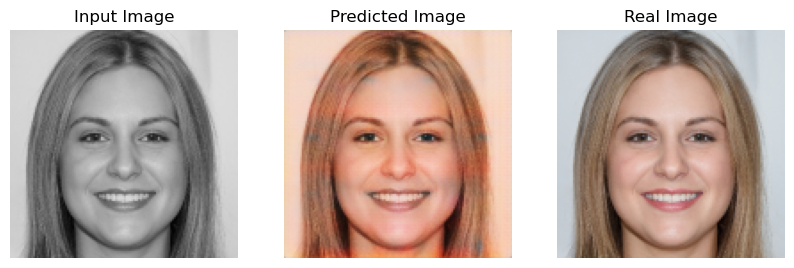

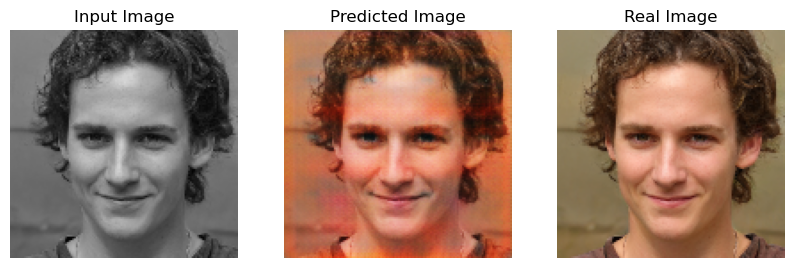

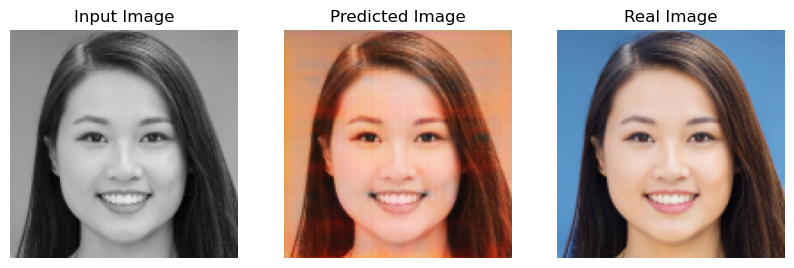

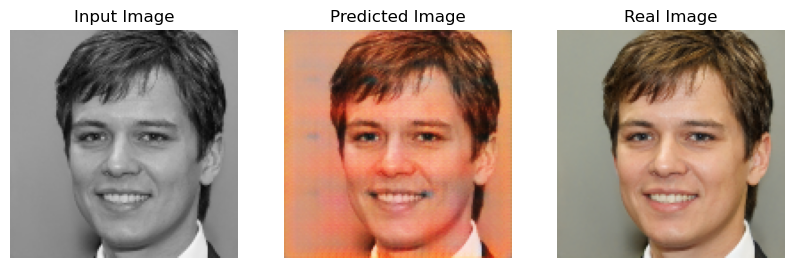

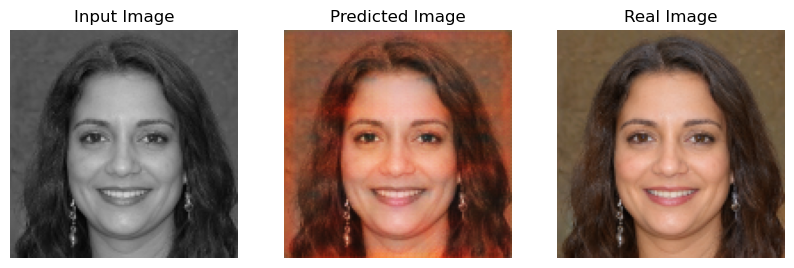

In [209]:
# run the chosen model on the testing set
for inp, tar in test_ds.take(5):
    generate_images(generator_1, inp, tar)

* We may see from the predicted image that, the model is working nicely, especially on the first and third images. The model also works well when the face is facing to the side as in the fourth image. 


* For further work in this area, it would be interesting to see if we can first detect the contour of the face, and then colourize the face segment by segment. 

* It should be noted that the prediction from the model is highly related to the training data. While developing this project notebook, the same *pix2pix* model was first trained using landscape photos and flower photos. 
* After training with landscape images, the prediction from validation is greyish-green. It is because the landscape is mostly forest, prairie, or seaside. 
* Subsequently the flower images are used for training, in the hope of giving the model some more colour. After the training was completed, the model gave predictions that every prediction had a splash of red colour in the middle.
* Therefore, it is speculated that the model aims to give a generalized colour hue from the training data according to different portions of the image. 

* With the understanding of the cGAN, the next project can be on styleGAN, of which the two inputs are not necessarily of the same nature. Using styleGAN, for example, we may generate a Monet-styled drawing of a landscape photo. It would be interesting to see the results. 


